### For the best experience, view this notebook on nbviewer:
[Open in nbviewer](https://nbviewer.org/github/ArturKosma/Learning/blob/main/jupyter/ai_for_games/exercises_3.6-3.8.ipynb)

In [1]:
import leqanimlib
import leqmath
import numpy as np

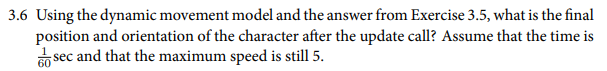

In [2]:
vel = np.array([3, 3], dtype=float) # Initial velocity.

dir_to_target = np.array([8, 2], dtype=float) - np.array([5, 6], dtype=float)
dir_to_target /= np.linalg.norm(dir_to_target) # Direction to target.

acc = 4

# Single addition means one update call.
vel += dir_to_target * acc * 0.016 # 0.016 is 16ms which means 1/60th of a second.

# Clamp velocity to max speed if surpassing.
speed = np.linalg.norm(vel)
if speed > 5:
    vel /= np.linalg.norm(vel)
    vel *= 5

print(vel)

[3.0384 2.9488]


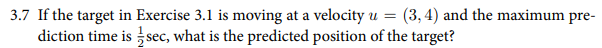

In [3]:
ex3_7 = leqanimlib.leqanimlib(xlim_max=20, ylim_max=20, title='Prediction')

p = np.array([5, 6], dtype=float)
v = np.array([3, 3], dtype=float)
q = np.array([8, 2], dtype=float)
u = np.array([3, 4], dtype=float)

character = ex3_7.add_object(ex3_7.Dot(p, 0, display_name='character'))
character.set_vel(v)
character.max_speed = 5
character.transform_text_velocity = True

target = ex3_7.add_object(ex3_7.Dot(q, 0, display_name='target'))
target.set_color('red')
target.set_vel(u)
target.max_speed = 5
target.transform_text_velocity = True

prediction = ex3_7.add_object(ex3_7.Dot(q, 0, display_name='prediction'))
prediction.set_arrow_enabled(False)
prediction.set_color('blue')
prediction.ghost_enabled = True

predicted_pos_firstframe = target.pos + (target.vel * 0.5) # This is the predicted position after 0.5s.

def tick_ex3_7(t):

    prediction.set_pos(target.pos + (target.vel * 0.5)) 

ex3_7.draw(tick_ex3_7)

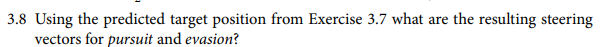

In [4]:
ex3_8 = leqanimlib.leqanimlib(xlim_max=20, ylim_max=20, title='Pursuit')

p = np.array([5, 6], dtype=float)
q = np.array([8, 2], dtype=float)
u = np.array([3, 4], dtype=float)

character = ex3_8.add_object(ex3_8.Dot(p, 0, display_name='character'))
character.max_speed = 5
character.transform_text_velocity = True

target = ex3_8.add_object(ex3_8.Dot(q, 0, display_name='target'))
target.set_color('red')
target.set_vel(u)
target.max_speed = 5
target.transform_text_velocity = True

prediction = ex3_8.add_object(ex3_8.Dot(q, 0, display_name='prediction'))
prediction.set_arrow_enabled(False)
prediction.set_color('blue')
prediction.ghost_enabled = True

predicted_pos_firstframe = target.pos + (target.vel * 0.5) # This is the predicted position after 0.5s.

character.set_vel(predicted_pos_firstframe - character.pos) # This is the pursuit velocity.

def tick_ex3_8(t):

    prediction.set_pos(target.pos + (target.vel * 0.5)) 

ex3_8.draw(tick_ex3_8)

In [5]:
ex3_8evasion = leqanimlib.leqanimlib(xlim_max=20, ylim_max=20, title='Evasion')

p = np.array([5, 6], dtype=float)
q = np.array([8, 2], dtype=float)
u = np.array([3, 4], dtype=float)

character = ex3_8evasion.add_object(ex3_8evasion.Dot(p, 0, display_name='character'))
character.max_speed = 5
character.transform_text_velocity = True

target = ex3_8evasion.add_object(ex3_8evasion.Dot(q, 0, display_name='target'))
target.set_color('red')
target.set_vel(u)
target.max_speed = 5
target.transform_text_velocity = True

prediction = ex3_8evasion.add_object(ex3_8evasion.Dot(q, 0, display_name='prediction'))
prediction.set_arrow_enabled(False)
prediction.set_color('blue')
prediction.ghost_enabled = True

predicted_pos_firstframe = target.pos + (target.vel * 0.5) # This is the predicted position after 0.5s.

character.set_vel((predicted_pos_firstframe - character.pos) * -1) # This is the evasion velocity.

def tick_ex3_8evasion(t):

    prediction.set_pos(target.pos + (target.vel * 0.5)) 

ex3_8evasion.draw(tick_ex3_8evasion)